In [1]:
import numpy as np
import matplotlib.pyplot as plt
from regions import Regions
import regions
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy import units as u
from spectral_cube import SpectralCube

from astropy.visualization.wcsaxes import add_scalebar
from astropy.visualization.wcsaxes import add_beam
from astropy.wcs.utils import proj_plane_pixel_scales

from smart_plotters.jwst_plots import JWSTCatalog, make_cat_use, make_brick_cat
from smart_plotters.cutout_plot import get_cutout_405, get_cutout_jwst_ice, Cutout
from smart_plotters import outflow_plots as op

In [2]:
pos_hmsfr = SkyCoord('17:46:21.4669695284', '-28:35:38.1118497742', unit=(u.hourangle, u.deg))
w = 1*u.arcmin
l = 1*u.arcmin

reg_cutout = regions.RectangleSkyRegion(center=pos_hmsfr, width=l, height=w)

cutout_hmsfr = Cutout(pos_hmsfr, w, l)

cutout_405 = get_cutout_405(pos_hmsfr, w, l)

fn_b3 = '/orange/adamginsburg/ACES/mosaics/continuum/12m_continuum_commonbeam_circular_reimaged_mosaic_MUSTANGfeathered.fits'
#'/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s10_0.Sgr_A_star_sci.v1aggregated_spw25_27_29_31_33_35.cont.I.iter1.image.tt0'
cutout_B3 = cutout_hmsfr.get_cutout(fn_b3)#, format='casa')

fn_b6 = '/orange/adamginsburg/cmz/dustridge/cloudc/alma/reimage/uid___A002_Xfbf8a1_Xfe1/uid___A001_X1590_X282a.CloudC_sci.spw25_27_29_31.cont.selfcal.I.tt0.pbcor.fits'
#'/orange/adamginsburg/jwst/cloudc/alma/member.uid___A001_X1590_X282a.CloudC_sci.spw29.mfs.I.manual.image.pbcor.fits'
cutout_B6 = cutout_hmsfr.get_cutout(fn_b6)

fn_b6_alt = '/orange/adamginsburg/jwst/cloudc/alma/danwalker/C_continuum_B6.fits'
cutout_B6_alt = cutout_hmsfr.get_cutout(fn_b6_alt)

fn_b3_alt = '/orange/adamginsburg/jwst/cloudc/alma/danwalker/C_continuum_B3.galactic.fits'
cutout_B3_alt = cutout_hmsfr.get_cutout(fn_b3_alt)

In [3]:
freq_CS, fn_CS = op.get_ACES_info('CS 2-1')

freq_CO = 230.538 * u.GHz
fn_CO = '/orange/adamginsburg/cmz/dustridge/cloudc/alma/reimage/uid___A002_Xfbf8a1_Xfe1/uid___A001_X1590_X282a.CloudC_sci.spw29.cube.selfcal.I.pbcor.fits'
#'/orange/adamginsburg/jwst/cloudc/alma/uid___A001_X1590_X282a.CloudC.spw29.merge.p.image'

In [4]:
c1_CS_outflows = op.OutflowPlot(pos_hmsfr, l, w, restfreq=freq_CS, cube_fn=fn_CS)
c1_CO_outflows = op.OutflowPlot(pos_hmsfr, l, w, restfreq=freq_CO, cube_fn=fn_CO)

In [5]:
cube_CS = SpectralCube.read(fn_CS).with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=freq_CS)
subcube_CS = cube_CS.subcube_from_regions([reg_cutout], minimize=False)

mom0_red_CS = subcube_CS.spectral_slab(40*u.km/u.s, 50*u.km/u.s).moment0()
mom0_blue_CS = subcube_CS.spectral_slab(30*u.km/u.s, 40*u.km/u.s).moment0()

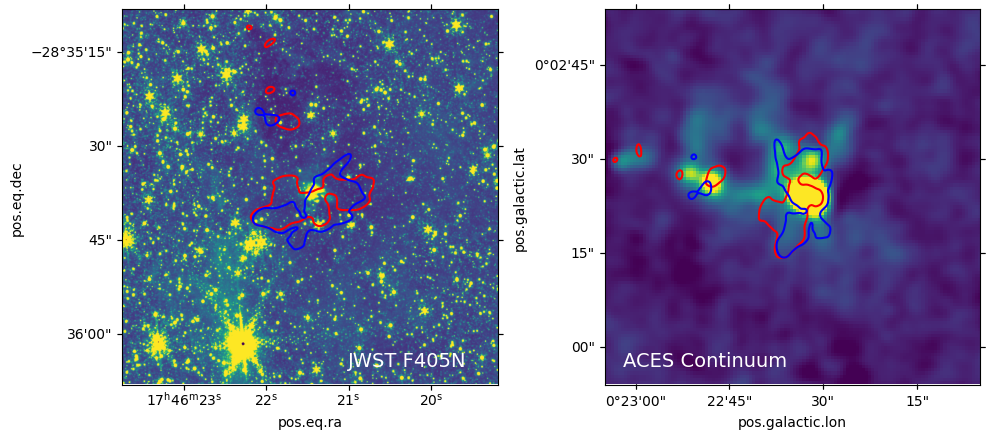

In [6]:
fig = plt.figure(figsize=(10,5))

ax1 = plt.subplot(121, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=50)
#c1_CS_outflows.plot_outflows(vcen=40*u.km/u.s, vmin=30*u.km/u.s, vmax=50*u.km/u.s, 
#                      ax=ax, blue_color='blue', red_color='red', nlevels=1)
ax1.contour(mom0_red_CS.data, levels=[np.nanpercentile(mom0_red_CS.data, 97)], colors='red', transform=ax1.get_transform(mom0_red_CS.wcs))
ax1.contour(mom0_blue_CS.data, levels=[np.nanpercentile(mom0_blue_CS.data, 97)], colors='blue', transform=ax1.get_transform(mom0_blue_CS.wcs))
ax1.text(0.6, 0.05, 'JWST F405N', transform=ax1.transAxes, color='white', fontsize=14)

ax2 = plt.subplot(122, projection=cutout_B3.wcs)
ax2.imshow(cutout_B3.data, vmin=np.nanpercentile(cutout_B3.data, 1), vmax=np.nanpercentile(cutout_B3.data, 99))
xlims = ax2.get_xlim()
ylims = ax2.get_ylim()
#c1_CS_outflows.plot_outflows(vcen=40*u.km/u.s, vmin=30*u.km/u.s, vmax=50*u.km/u.s, ax=ax2, blue_color='blue', red_color='red', nlevels=1)
ax2.contour(mom0_red_CS.data, levels=[np.nanpercentile(mom0_red_CS.data, 97)], colors='red', transform=ax2.get_transform(mom0_red_CS.wcs))
ax2.contour(mom0_blue_CS.data, levels=[np.nanpercentile(mom0_blue_CS.data, 97)], colors='blue', transform=ax2.get_transform(mom0_blue_CS.wcs))
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)
ax2.text(0.05, 0.05, 'ACES Continuum', transform=ax2.transAxes, color='white', fontsize=14)

plt.tight_layout()

In [7]:
cube_CO = SpectralCube.read(fn_CO).with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=freq_CO)
subcube_CO = cube_CO.subcube_from_regions([reg_cutout], minimize=False)

mom0_red_CO = subcube_CO.spectral_slab(40*u.km/u.s, 50*u.km/u.s).moment0()
mom0_blue_CO = subcube_CO.spectral_slab(30*u.km/u.s, 40*u.km/u.s).moment0()

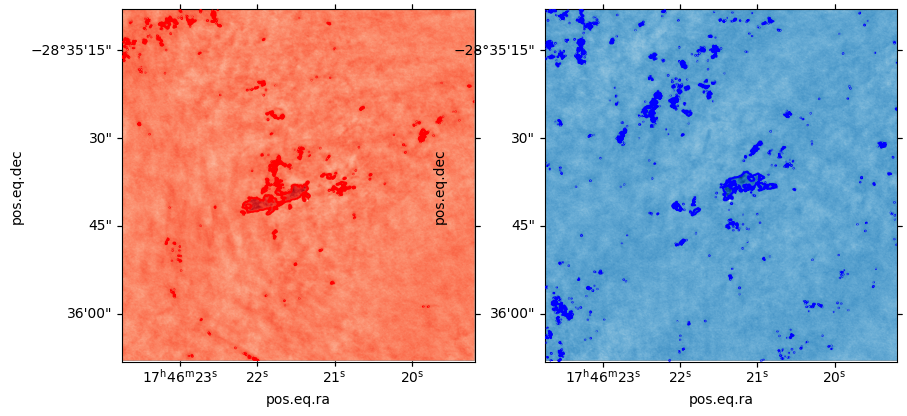

In [8]:
fig = plt.figure(figsize=(10,5))

ax1 = plt.subplot(121, projection=mom0_red_CO.wcs)
ax1.imshow(mom0_red_CO.data, origin='lower', cmap='Reds')
ax1.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax1.get_transform(mom0_red_CO.wcs))

ax2 = plt.subplot(122, projection=mom0_blue_CO.wcs)
ax2.imshow(mom0_blue_CO.data, origin='lower', cmap='Blues')
ax2.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax2.get_transform(mom0_blue_CO.wcs))

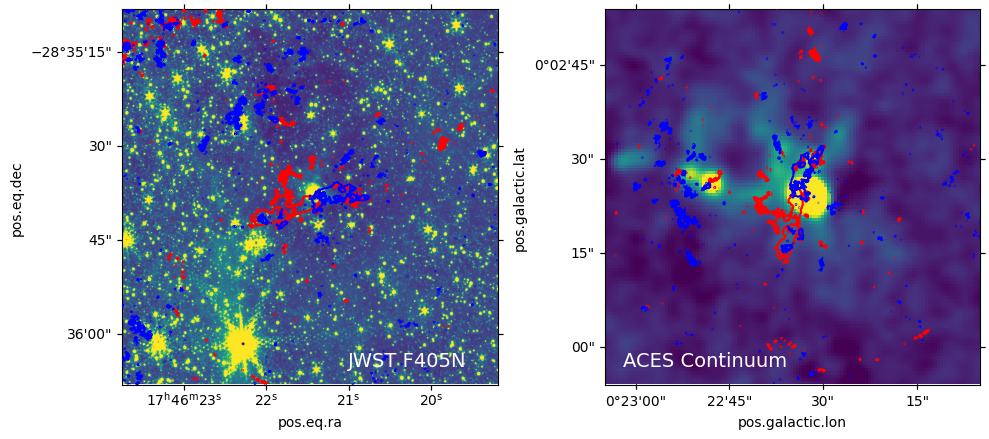

In [9]:
fig = plt.figure(figsize=(10,5))

ax1 = plt.subplot(121, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=50)
xlims = ax1.get_xlim()
ylims = ax1.get_ylim()
ax1.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax1.get_transform(mom0_red_CO.wcs))
ax1.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax1.get_transform(mom0_blue_CO.wcs))
ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax1.text(0.6, 0.05, 'JWST F405N', transform=ax1.transAxes, color='white', fontsize=14)

ax2 = plt.subplot(122, projection=cutout_B3.wcs)
ax2.imshow(cutout_B3.data, vmin=np.nanpercentile(cutout_B3.data, 1), vmax=np.nanpercentile(cutout_B3.data, 99))
xlims = ax2.get_xlim()
ylims = ax2.get_ylim()
ax2.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax2.get_transform(mom0_red_CO.wcs))
ax2.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax2.get_transform(mom0_blue_CO.wcs))
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)
ax2.text(0.05, 0.05, 'ACES Continuum', transform=ax2.transAxes, color='white', fontsize=14)

plt.tight_layout()

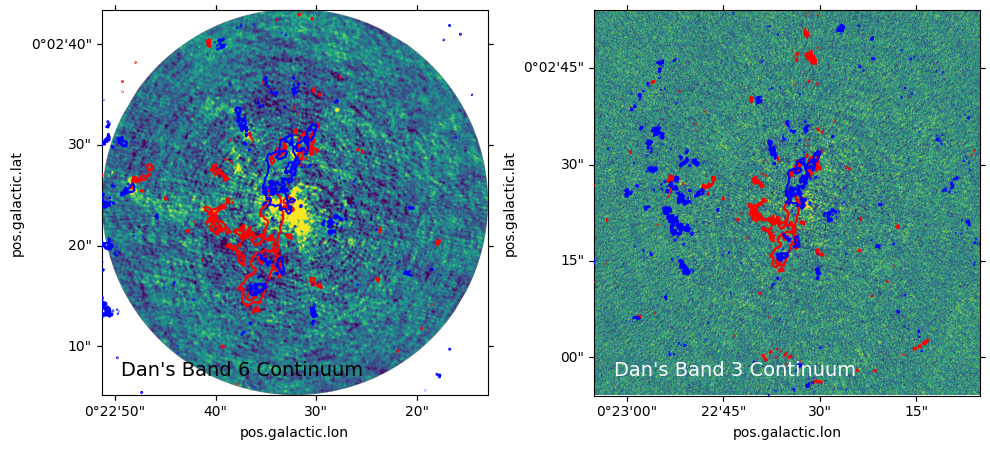

In [10]:
fig = plt.figure(figsize=(10,5))

ax1 = plt.subplot(121, projection=cutout_B6_alt.wcs)
ax1.imshow(cutout_B6_alt.data, vmin=np.nanpercentile(cutout_B6_alt.data, 1), vmax=np.nanpercentile(cutout_B6_alt.data, 99))
#c1_CO_outflows.plot_outflows(vcen=40*u.km/u.s, vmin=30*u.km/u.s, vmax=50*u.km/u.s, ax=ax, blue_color='blue', red_color='red', nlevels=1)
xlims = ax1.get_xlim()
ylims = ax1.get_ylim()
ax1.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax1.get_transform(mom0_red_CO.wcs))
ax1.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax1.get_transform(mom0_blue_CO.wcs))
ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax1.text(0.05, 0.05, 'Dan\'s Band 6 Continuum', transform=ax1.transAxes, color='k', fontsize=14)

ax2 = plt.subplot(122, projection=cutout_B3_alt.wcs)
ax2.imshow(cutout_B3_alt.data, vmin=np.nanpercentile(cutout_B3_alt.data, 1), vmax=np.nanpercentile(cutout_B3_alt.data, 99))
#c1_CO_outflows.plot_outflows(vcen=40*u.km/u.s, vmin=30*u.km/u.s, vmax=50*u.km/u.s, ax=ax2, blue_color='blue', red_color='red', nlevels=1)
xlims = ax2.get_xlim()
ylims = ax2.get_ylim()
ax2.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax2.get_transform(mom0_red_CO.wcs))
ax2.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax2.get_transform(mom0_blue_CO.wcs))
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)
ax2.text(0.05, 0.05, 'Dan\'s Band 3 Continuum', transform=ax2.transAxes, color='white', fontsize=14)

plt.tight_layout()

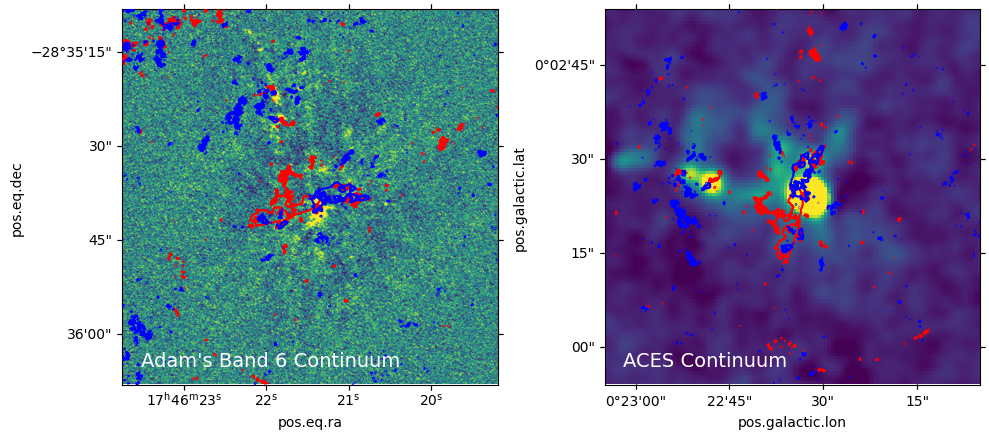

In [11]:
fig = plt.figure(figsize=(10,5))

ax1 = plt.subplot(121, projection=cutout_B6.wcs)
ax1.imshow(cutout_B6.data, vmin=np.nanpercentile(cutout_B6.data, 1), vmax=np.nanpercentile(cutout_B6.data, 99))
#c1_CO_outflows.plot_outflows(vcen=40*u.km/u.s, vmin=30*u.km/u.s, vmax=50*u.km/u.s, ax=ax, blue_color='blue', red_color='red', nlevels=1)
xlims = ax1.get_xlim()
ylims = ax1.get_ylim()
ax1.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax1.get_transform(mom0_red_CO.wcs))
ax1.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax1.get_transform(mom0_blue_CO.wcs))
ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax1.text(0.05, 0.05, 'Adam\'s Band 6 Continuum', transform=ax1.transAxes, color='white', fontsize=14)

ax2 = plt.subplot(122, projection=cutout_B3.wcs)
ax2.imshow(cutout_B3.data, vmin=np.nanpercentile(cutout_B3.data, 1), vmax=np.nanpercentile(cutout_B3.data, 99))
xlims = ax2.get_xlim()
ylims = ax2.get_ylim()
ax2.contour(mom0_red_CO.data, levels=[np.nanpercentile(mom0_red_CO.data, 99)], colors='red', transform=ax2.get_transform(mom0_red_CO.wcs))
ax2.contour(mom0_blue_CO.data, levels=[np.nanpercentile(mom0_blue_CO.data, 99)], colors='blue', transform=ax2.get_transform(mom0_blue_CO.wcs))
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)
ax2.text(0.05, 0.05, 'ACES Continuum', transform=ax2.transAxes, color='white', fontsize=14)

plt.tight_layout()

# Large Figure

In [26]:
cont_fn = '/orange/adamginsburg/cmz/dustridge/cloudc/alma/reimage/uid___A002_Xfbf8a1_Xfe1/uid___A001_X1590_X282a.CloudC_sci.spw25_27_29_31.cont.selfcal.I.tt0.pbcor.fits'
cont_hdu = fits.open(cont_fn)[0]
position_ctr = SkyCoord('17:46:21.3644986214', '-28:35:27.5072122119', unit=(u.hourangle, u.deg))
cutout_cloudc = Cutout(position=position_ctr, l=45*u.arcsec, w=45*u.arcsec)
cutout_cont_B6 = cutout_cloudc.get_cutout(cont_fn)
cutout_jwst_ice, cutout_jwst_ice_ww = get_cutout_jwst_ice(position_ctr, 45*u.arcsec, 45*u.arcsec)

In [20]:
pos_core1 = SkyCoord('17:46:22.1924038535', '-28:35:11.9996225119', unit=(u.hourangle, u.deg))
pos_core2 = SkyCoord('17:46:21.8469644966', '-28:35:25.7602004966', unit=(u.hourangle, u.deg))
pos_core3 = SkyCoord('17:46:20.9856110453', '-28:35:37.9661196049', unit=(u.hourangle, u.deg))
pos_core4 = SkyCoord('17:46:21.8864560082', '-28:35:22.4823616161', unit=(u.hourangle, u.deg))
#SkyCoord('17:46:21.0677075860', '-28:35:33.3462539009', unit=(u.hourangle, u.deg))
#SkyCoord('17:46:20.5468063746', '-28:35:39.3811895426', unit=(u.hourangle, u.deg))

cutout_c1 = Cutout(position=pos_core1, l=5*u.arcsec, w=5*u.arcsec)
cutout_c2 = Cutout(position=pos_core2, l=5*u.arcsec, w=5*u.arcsec)
cutout_c3 = Cutout(position=pos_core3, l=5*u.arcsec, w=5*u.arcsec)
cutout_c4 = Cutout(position=pos_core4, l=5*u.arcsec, w=5*u.arcsec)

cutout_B6_c1 = cutout_c1.get_cutout(cont_fn)
cutout_B6_c2 = cutout_c2.get_cutout(cont_fn)
cutout_B6_c3 = cutout_c3.get_cutout(cont_fn)
cutout_B6_c4 = cutout_c4.get_cutout(cont_fn)

cutout_jwst_ice_c1, cutout_jwst_ice_ww_c1 = get_cutout_jwst_ice(pos_core1, 5*u.arcsec, 5*u.arcsec)
cutout_jwst_ice_c2, cutout_jwst_ice_ww_c2 = get_cutout_jwst_ice(pos_core2, 5*u.arcsec, 5*u.arcsec)
cutout_jwst_ice_c3, cutout_jwst_ice_ww_c3 = get_cutout_jwst_ice(pos_core3, 5*u.arcsec, 5*u.arcsec)
cutout_jwst_ice_c4, cutout_jwst_ice_ww_c4 = get_cutout_jwst_ice(pos_core4, 5*u.arcsec, 5*u.arcsec)

In [21]:
freq_CO = 230.538 * u.GHz
fn_CO = '/orange/adamginsburg/cmz/dustridge/cloudc/alma/reimage/uid___A002_Xfbf8a1_Xfe1/uid___A001_X1590_X282a.CloudC_sci.spw29.cube.selfcal.I.pbcor.fits'

freq_SiO = 217.104984 * u.GHz
fn_SiO = '/orange/adamginsburg/jwst/cloudc/alma/uid___A001_X1590_X282a.CloudC.spw25.merge.p.image'

outflows_c1 = op.OutflowPlot(pos_core1, l=5*u.arcsec, w=5*u.arcsec, restfreq=freq_SiO, cube_fn=fn_SiO)#restfreq=freq_CO, cube_fn=fn_CO)
outflows_c2 = op.OutflowPlot(pos_core2, l=5*u.arcsec, w=5*u.arcsec, restfreq=freq_SiO, cube_fn=fn_SiO)#restfreq=freq_CO, cube_fn=fn_CO)
outflows_c3 = op.OutflowPlot(pos_core3, l=5*u.arcsec, w=5*u.arcsec, restfreq=freq_SiO, cube_fn=fn_SiO)#restfreq=freq_CO, cube_fn=fn_CO)
outflows_c4 = op.OutflowPlot(pos_core4, l=5*u.arcsec, w=5*u.arcsec, restfreq=freq_SiO, cube_fn=fn_SiO)#restfreq=freq_CO, cube_fn=fn_CO)

In [6]:
cube_SiO = SpectralCube.read(fn_SiO).with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=freq_SiO)

subcube_SiO_c1 = cube_SiO.subcube_from_regions([regions.RectangleSkyRegion(pos_core1, 5*u.arcsec, 5*u.arcsec)], minimize=False)
subcube_SiO_c1_red = subcube_SiO_c1.spectral_slab(40*u.km/u.s, 90*u.km/u.s)
subcube_SiO_c1_blue = subcube_SiO_c1.spectral_slab(-10*u.km/u.s, 40*u.km/u.s)

subcube_SiO_c2 = cube_SiO.subcube_from_regions([regions.RectangleSkyRegion(pos_core2, 5*u.arcsec, 5*u.arcsec)], minimize=False)
subcube_SiO_c2_red = subcube_SiO_c2.spectral_slab(40*u.km/u.s, 90*u.km/u.s)
subcube_SiO_c2_blue = subcube_SiO_c2.spectral_slab(-10*u.km/u.s, 40*u.km/u.s)

subcube_SiO_c3 = cube_SiO.subcube_from_regions([regions.RectangleSkyRegion(pos_core3, 5*u.arcsec, 5*u.arcsec)], minimize=False)
subcube_SiO_c3_red = subcube_SiO_c3.spectral_slab(40*u.km/u.s, 90*u.km/u.s)
subcube_SiO_c3_blue = subcube_SiO_c3.spectral_slab(-10*u.km/u.s, 40*u.km/u.s)

mom0_c1_SiO_red =  subcube_SiO_c1_red.moment0() #outflows_c1.get_moment0(40*u.km/u.s, 90*u.km/u.s)
mom0_c1_SiO_blue = subcube_SiO_c1_blue.moment0() #outflows_c1.get_moment0(-10*u.km/u.s, 40*u.km/u.s)

mom0_c2_SiO_red =  subcube_SiO_c2_red.moment0() #outflows_c2.get_moment0(40*u.km/u.s, 90*u.km/u.s)
mom0_c2_SiO_blue = subcube_SiO_c2_blue.moment0() #outflows_c2.get_moment0(-10*u.km/u.s, 40*u.km/u.s)

mom0_c3_SiO_red =  subcube_SiO_c3_red.moment0() #outflows_c3.get_moment0(40*u.km/u.s, 90*u.km/u.s)
mom0_c3_SiO_blue = subcube_SiO_c3_blue.moment0() #outflows_c3.get_moment0(-10*u.km/u.s, 40*u.km/u.s)

/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:248: RuntimeWarning: divide by zero encountered in scalar remainder
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/radio-beam/radio_beam/multiple_beams.py:278: UserWarning: Do not use the average beam for convolution! Use the smallest common beam from `Beams.common_beam()`.
  warnings.warn("Do not use the average beam for convolution! Use the"
/blue/adamginsburg/adamginsburg/repos/radio-beam/radio_beam/multiple_beams.py:278: UserWarning: Do not use the average beam for convolution! Use the smallest common beam from `Beams.common_beam()`.
  warnings.warn("Do not use the average beam for convolution! Use the"
/blue/adamginsburg/adamginsburg/repos/radio-beam/radio_beam/multiple_beams.py:278: UserWarning: Do not use the average beam for convolution! Use the smallest common beam from `Beams.common_beam()`.
  warnings.warn("Do not use the average b

In [25]:
subcube_SiO_c4 = cube_SiO.subcube_from_regions([regions.RectangleSkyRegion(pos_core4, 5*u.arcsec, 5*u.arcsec)], minimize=False)
subcube_SiO_c4_red = subcube_SiO_c4.spectral_slab(40*u.km/u.s, 90*u.km/u.s)
subcube_SiO_c4_blue = subcube_SiO_c4.spectral_slab(-10*u.km/u.s, 40*u.km/u.s)

mom0_c4_SiO_red =  subcube_SiO_c4_red.moment0() #outflows_c4.get_moment0(40*u.km/u.s, 90*u.km/u.s)
mom0_c4_SiO_blue = subcube_SiO_c4_blue.moment0() #outflows_c4.get_moment0(-10*u.km/u.s, 40*u.km/u.s)

/blue/adamginsburg/adamginsburg/repos/radio-beam/radio_beam/multiple_beams.py:278: UserWarning: Do not use the average beam for convolution! Use the smallest common beam from `Beams.common_beam()`.
  warnings.warn("Do not use the average beam for convolution! Use the"
/blue/adamginsburg/adamginsburg/repos/radio-beam/radio_beam/multiple_beams.py:278: UserWarning: Do not use the average beam for convolution! Use the smallest common beam from `Beams.common_beam()`.
  warnings.warn("Do not use the average beam for convolution! Use the"


In [23]:
cube_CO = SpectralCube.read(fn_CO).with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=freq_CO)

subcube_CO_c4 = cube_CO.subcube_from_regions([regions.RectangleSkyRegion(pos_core4, 5*u.arcsec, 5*u.arcsec)], minimize=False)
subcube_CO_c4_red = subcube_CO_c4.spectral_slab(40*u.km/u.s, 90*u.km/u.s)
subcube_CO_c4_blue = subcube_CO_c4.spectral_slab(-10*u.km/u.s, 40*u.km/u.s)

mom0_c4_CO_red =  subcube_CO_c4_red.moment0() #outflows_c4.get_moment0(40*u.km/u.s, 90*u.km/u.s)
mom0_c4_CO_blue = subcube_CO_c4_blue.moment0() #outflows_c4.get_moment0(-10*u.km/u.s, 40*u.km/u.s)

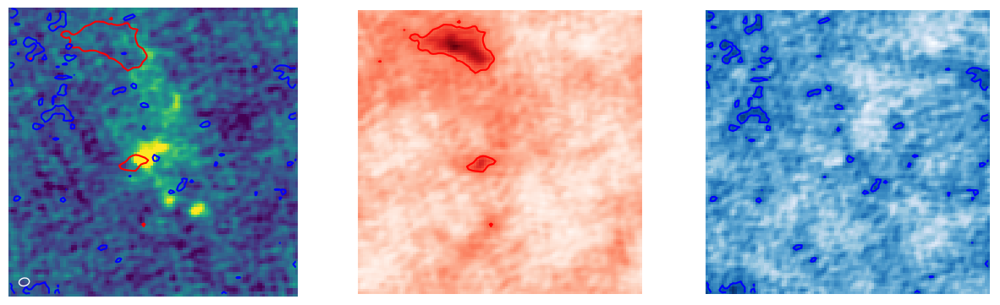

In [31]:
fig = plt.figure(figsize=(15,5))
ax = plt.subplot(131, projection=cutout_B6_c4.wcs)
ax.imshow(cutout_B6_c4.data, vmin=np.nanpercentile(cutout_B6_c4.data, 0.5), vmax=np.nanpercentile(cutout_B6_c4.data, 99.5))
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c4.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
#ax.contour(mom0_c4_SiO_red.data, levels=[np.nanpercentile(mom0_c4_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c4_SiO_red.wcs))
ax.contour(mom0_c4_CO_red.data, levels=[np.nanpercentile(mom0_c4_CO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c4_CO_red.wcs))
#ax.contour(mom0_c4_SiO_blue.data, levels=[np.nanpercentile(mom0_c4_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c4_SiO_blue.wcs))
ax.contour(mom0_c4_CO_blue.data, levels=[np.nanpercentile(mom0_c4_CO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c4_CO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
add_beam(header=cont_hdu.header, ax=ax, facecolor='none', edgecolor='white', corner='bottom left')
ax.set_axis_off()

ax2 = plt.subplot(132, projection=mom0_c4_CO_red.wcs)
ax2.imshow(mom0_c4_CO_red.data, origin='lower', cmap='Reds')
ax2.contour(mom0_c4_CO_red.data, levels=[np.nanpercentile(mom0_c4_CO_red.data, 97)], colors='red', transform=ax2.get_transform(mom0_c4_CO_red.wcs))
ax2.set_axis_off()

ax3 = plt.subplot(133, projection=mom0_c4_CO_blue.wcs)
ax3.imshow(mom0_c4_CO_blue.data, origin='lower', cmap='Blues')
ax3.contour(mom0_c4_CO_blue.data, levels=[np.nanpercentile(mom0_c4_CO_blue.data, 97)], colors='blue', transform=ax3.get_transform(mom0_c4_CO_blue.wcs))
ax3.set_axis_off()

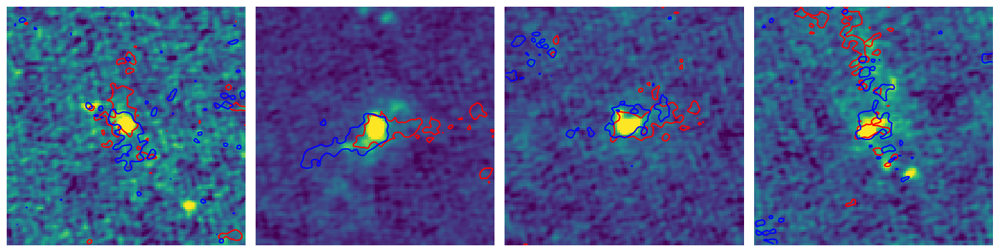

In [8]:
fig = plt.figure(figsize=(15,5))

ax = plt.subplot(141, projection=cutout_B6_c1.wcs)

ax.imshow(cutout_B6_c1.data, vmin=np.nanpercentile(cutout_B6_c1.data, 0.5), vmax=np.nanpercentile(cutout_B6_c1.data, 99.5))
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c1.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
ax.contour(mom0_c1_SiO_red.data, levels=[np.nanpercentile(mom0_c1_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c1_SiO_red.wcs))
ax.contour(mom0_c1_SiO_blue.data, levels=[np.nanpercentile(mom0_c1_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c1_SiO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_axis_off()

ax = plt.subplot(142, projection=cutout_B6_c2.wcs)
ax.imshow(cutout_B6_c2.data, vmin=np.nanpercentile(cutout_B6_c2.data, 0.5), vmax=np.nanpercentile(cutout_B6_c2.data, 99.5))
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c2.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
ax.contour(mom0_c2_SiO_red.data, levels=[np.nanpercentile(mom0_c2_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c2_SiO_red.wcs))
ax.contour(mom0_c2_SiO_blue.data, levels=[np.nanpercentile(mom0_c2_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c2_SiO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_axis_off()

ax = plt.subplot(143, projection=cutout_B6_c3.wcs)
ax.imshow(cutout_B6_c3.data, vmin=np.nanpercentile(cutout_B6_c3.data, 0.5), vmax=np.nanpercentile(cutout_B6_c3.data, 99.5))
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c3.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
ax.contour(mom0_c3_SiO_red.data, levels=[np.nanpercentile(mom0_c3_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c3_SiO_red.wcs))
ax.contour(mom0_c3_SiO_blue.data, levels=[np.nanpercentile(mom0_c3_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c3_SiO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_axis_off()

ax = plt.subplot(144, projection=cutout_B6_c4.wcs)
ax.imshow(cutout_B6_c4.data, vmin=np.nanpercentile(cutout_B6_c4.data, 0.5), vmax=np.nanpercentile(cutout_B6_c4.data, 99.5))
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c4.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
ax.contour(mom0_c4_SiO_red.data, levels=[np.nanpercentile(mom0_c4_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c4_SiO_red.wcs))
ax.contour(mom0_c4_SiO_blue.data, levels=[np.nanpercentile(mom0_c4_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c4_SiO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_axis_off()

plt.tight_layout()

In [18]:
ang = (0.5*u.pc/(8*u.kpc)).to(u.arcmin, equivalencies=u.dimensionless_angles())
ang

<Quantity 0.21485917 arcmin>

In [21]:
from radio_beam import Beam
beam_b6 = Beam.from_fits_header(fits.getheader(fn_b6))
beam_b6

Beam: BMAJ=0.179396495223048 arcsec BMIN=0.135777905583372 arcsec BPA=-77.05908203125 deg

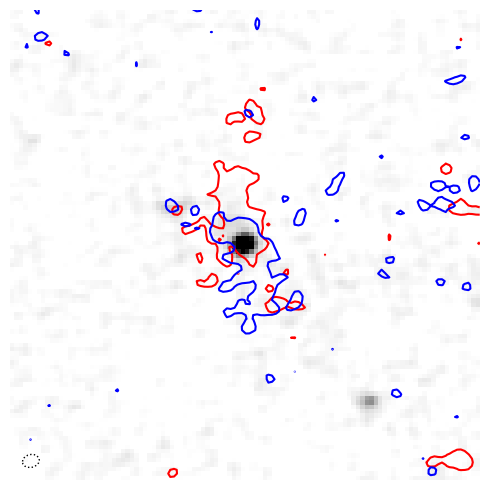

In [34]:
fig = plt.figure(figsize=(5,5))

ax = plt.subplot(111, projection=cutout_B6_c1.wcs)

ax.imshow(cutout_B6_c1.data, vmin=0, vmax=np.nanpercentile(cutout_B6_c1.data, 99.9), cmap='Greys')
add_beam(ax=ax, header=fits.getheader(fn_b6), corner='bottom left', edgecolor='k', facecolor='none', linestyle='dotted')
xlims = ax.get_xlim()
ylims = ax.get_ylim()
#outflows_c1.plot_outflows(vcen=40*u.km/u.s, vmin=-10*u.km/u.s, vmax=90*u.km/u.s, blue_color='blue', red_color='red', nlevels=1, ax=ax)
ax.contour(mom0_c1_SiO_red.data, levels=[np.nanpercentile(mom0_c1_SiO_red.data, 97)], colors='red', transform=ax.get_transform(mom0_c1_SiO_red.wcs))
ax.contour(mom0_c1_SiO_blue.data, levels=[np.nanpercentile(mom0_c1_SiO_blue.data, 97)], colors='blue', transform=ax.get_transform(mom0_c1_SiO_blue.wcs))
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_axis_off()


plt.tight_layout()

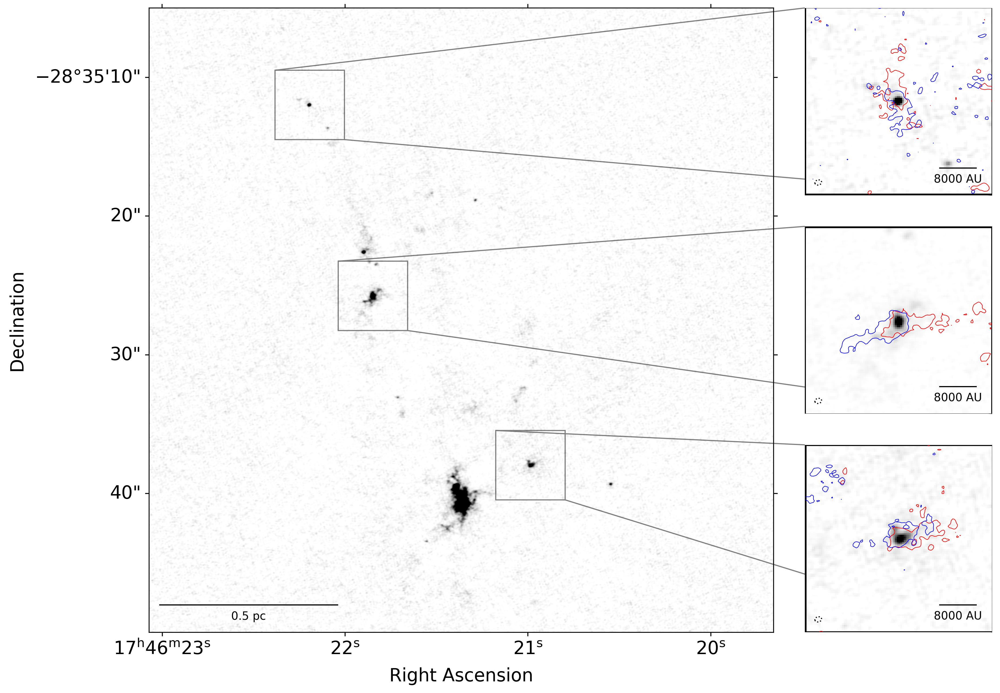

In [37]:
plt.figure(figsize=(24,10), dpi=300)

ax = plt.subplot(111, projection=cutout_cont_B6.wcs)#, origin='lower')
ax.imshow(cutout_cont_B6.data, cmap='Greys', vmin=0, vmax=np.nanpercentile(cutout_cont_B6.data, 99.9))
add_scalebar(ax, ang, label="0.5 pc", color='k', fontproperties={"size": 10}, corner='bottom left')
#add_beam(ax=ax, header=fits.getheader(fn_b6), corner='bottom left', edgecolor='k', facecolor='none', linestyle='dotted')

pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_cont_B6.wcs)[0]*u.deg/u.pix)

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})

ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

ins_ax_1 = ax.inset_axes([1.05, .7, .3, .3], projection=cutout_B6_c1.wcs) 
ins_ax_1.imshow(cutout_B6_c1.data, cmap='Greys', vmin=0, vmax=np.nanpercentile(cutout_B6_c1.data, 99.9))#, vmin=np.nanpercentile(cutout_B6_c1.data, 0.5), vmax=np.nanpercentile(cutout_B6_c1.data, 99.5))
add_beam(ax=ins_ax_1, header=fits.getheader(fn_b6), corner='bottom left', edgecolor='k', facecolor='none', linestyle='dotted')
ins_ax_1.set_axis_off()
xlims = ins_ax_1.get_xlim()
ylims = ins_ax_1.get_ylim()
ins_ax_1.contour(mom0_c1_SiO_red.data, transform=ins_ax_1.get_transform(mom0_c1_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c1_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_1.contour(mom0_c1_SiO_blue.data, transform=ins_ax_1.get_transform(mom0_c1_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c1_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
ins_ax_1.set_xlim(xlims)
ins_ax_1.set_ylim(ylims)
add_scalebar(ins_ax_1, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core1, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_B6_c1.wcs)
pixel_region.plot(ax=ins_ax_1, color='k', linewidth=2)
pos1 = SkyCoord.to_pixel(pos_core1, wcs=cutout_cont_B6.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor="black")

ins_ax_2 = ax.inset_axes([1.05, 0.35, 0.3, 0.3], projection=cutout_B6_c2.wcs)
ins_ax_2.imshow(cutout_B6_c2.data, cmap='Greys', vmin=0, vmax=np.nanpercentile(cutout_B6_c2.data, 99.9))#, vmin=np.nanpercentile(cutout_B6_c2.data, 0.5), vmax=np.nanpercentile(cutout_B6_c2.data, 99.5))
add_beam(ax=ins_ax_2, header=fits.getheader(fn_b6), corner='bottom left', edgecolor='k', facecolor='none', linestyle='dotted')
ins_ax_2.set_axis_off()
xlims = ins_ax_2.get_xlim()
ylims = ins_ax_2.get_ylim()
ins_ax_2.contour(mom0_c2_SiO_red.data, transform=ins_ax_2.get_transform(mom0_c2_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c2_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow2_highv.data),
           colors='red', linewidths=0.5)
ins_ax_2.contour(mom0_c2_SiO_blue.data, transform=ins_ax_2.get_transform(mom0_c2_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c2_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow2_lowv.data),
           colors='blue', linewidths=0.5)
ins_ax_2.set_xlim(xlims)
ins_ax_2.set_ylim(ylims)
add_scalebar(ins_ax_2, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core2, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_B6_c2.wcs)
pixel_region.plot(ax=ins_ax_2, color='k', linewidth=2)
pos2 = SkyCoord.to_pixel(pos_core2, wcs=cutout_cont_B6.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor="black")

ins_ax_3 = ax.inset_axes([1.05, 0.0, 0.3, 0.3], projection=cutout_B6_c3.wcs)
ins_ax_3.imshow(cutout_B6_c3.data, cmap='Greys', vmin=0, vmax=np.nanpercentile(cutout_B6_c3.data, 99.9))#, vmin=np.nanpercentile(cutout_B6_c3.data, 0.5), vmax=np.nanpercentile(cutout_B6_c3.data, 99.5))
add_beam(ax=ins_ax_3, header=fits.getheader(fn_b6), corner='bottom left', edgecolor='k', facecolor='none', linestyle='dotted')
ins_ax_3.set_axis_off()
xlims = ins_ax_3.get_xlim()
ylims = ins_ax_3.get_ylim()
ins_ax_3.contour(mom0_c3_SiO_red.data, transform=ins_ax_3.get_transform(mom0_c3_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c3_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow3_highv.data),
           colors='red', linewidths=0.5)
ins_ax_3.contour(mom0_c3_SiO_blue.data, transform=ins_ax_3.get_transform(mom0_c3_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c3_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow3_lowv.data),
           colors='blue', linewidths=0.5)
ins_ax_3.set_xlim(xlims)
ins_ax_3.set_ylim(ylims)
add_scalebar(ins_ax_3, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core3, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_B6_c3.wcs)
pixel_region.plot(ax=ins_ax_3, color='k', linewidth=2)
pos3 = SkyCoord.to_pixel(pos_core3, wcs=cutout_cont_B6.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos3[0]-dx/2, pos3[1]-dx/2, dx, dx], inset_ax=ins_ax_3, edgecolor="black")

print()
plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.pdf', bbox_inches='tight')
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.png', bbox_inches='tight')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02753325502025972..2.749753576493737].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.13421208286700295..1.7076002745376255].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11942494562271987..1.8521993849729412].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1524859566537782..1.1586631203314082].


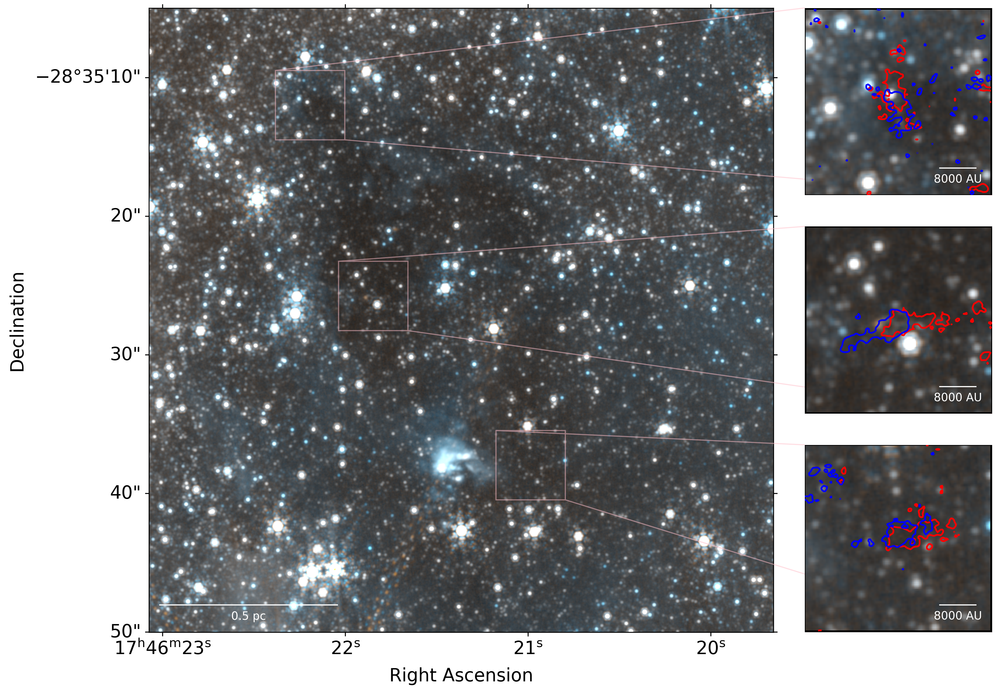

In [20]:
plt.figure(figsize=(24,10), dpi=300)

ax = plt.subplot(111, projection=cutout_jwst_ice_ww)#, origin='lower')
ax.imshow(cutout_jwst_ice)
add_scalebar(ax, ang, label="0.5 pc", color='white', fontproperties={"size": 10}, corner='bottom left')

pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_jwst_ice_ww)[0]*u.deg/u.pix)

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})

ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

ins_ax_1 = ax.inset_axes([1.05, .7, .3, .3], projection=cutout_jwst_ice_ww_c1) 
ins_ax_1.imshow(cutout_jwst_ice_c1)
ins_ax_1.set_axis_off()
xlims = ins_ax_1.get_xlim()
ylims = ins_ax_1.get_ylim()
ins_ax_1.contour(mom0_c1_SiO_red.data, transform=ins_ax_1.get_transform(mom0_c1_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c1_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=1.5)
ins_ax_1.contour(mom0_c1_SiO_blue.data, transform=ins_ax_1.get_transform(mom0_c1_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c1_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=1.5)
ins_ax_1.set_xlim(xlims)
ins_ax_1.set_ylim(ylims)
add_scalebar(ins_ax_1, u.Quantity(1*u.arcsec), label="8000 AU", color='white', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core1, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_jwst_ice_ww_c1)
pixel_region.plot(ax=ins_ax_1, color='k', linewidth=2)
pos1 = SkyCoord.to_pixel(pos_core1, wcs=cutout_jwst_ice_ww)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor="pink")

ins_ax_2 = ax.inset_axes([1.05, 0.35, 0.3, 0.3], projection=cutout_jwst_ice_ww_c2)
ins_ax_2.imshow(cutout_jwst_ice_c2)
ins_ax_2.set_axis_off()
xlims = ins_ax_2.get_xlim()
ylims = ins_ax_2.get_ylim()
ins_ax_2.contour(mom0_c2_SiO_red.data, transform=ins_ax_2.get_transform(mom0_c2_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c2_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow2_highv.data),
           colors='red', linewidths=1.5)
ins_ax_2.contour(mom0_c2_SiO_blue.data, transform=ins_ax_2.get_transform(mom0_c2_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c2_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow2_lowv.data),
           colors='blue', linewidths=1.5)
ins_ax_2.set_xlim(xlims)
ins_ax_2.set_ylim(ylims)
add_scalebar(ins_ax_2, u.Quantity(1*u.arcsec), label="8000 AU", color='white', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core2, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_jwst_ice_ww_c2)
pixel_region.plot(ax=ins_ax_2, color='k', linewidth=2)
pos2 = SkyCoord.to_pixel(pos_core2, wcs=cutout_jwst_ice_ww)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor="pink")

ins_ax_3 = ax.inset_axes([1.05, 0.0, 0.3, 0.3], projection=cutout_jwst_ice_ww_c3)
ins_ax_3.imshow(cutout_jwst_ice_c3)
ins_ax_3.set_axis_off()
xlims = ins_ax_3.get_xlim()
ylims = ins_ax_3.get_ylim()
ins_ax_3.contour(mom0_c3_SiO_red.data, transform=ins_ax_3.get_transform(mom0_c3_SiO_red.wcs), 
           levels=[np.nanpercentile(mom0_c3_SiO_red.data, 97)], 
           #levels=get_step_list(cutout_outflow3_highv.data),
           colors='red', linewidths=1.5)
ins_ax_3.contour(mom0_c3_SiO_blue.data, transform=ins_ax_3.get_transform(mom0_c3_SiO_blue.wcs), 
           levels=[np.nanpercentile(mom0_c3_SiO_blue.data, 97)], 
           #levels=get_step_list(cutout_outflow3_lowv.data),
           colors='blue', linewidths=1.5)
ins_ax_3.set_xlim(xlims)
ins_ax_3.set_ylim(ylims)
add_scalebar(ins_ax_3, u.Quantity(1*u.arcsec), label="8000 AU", color='white', fontproperties={"size": 10})
reg = regions.RectangleSkyRegion(pos_core3, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_jwst_ice_ww_c3)
pixel_region.plot(ax=ins_ax_3, color='k', linewidth=2)
pos3 = SkyCoord.to_pixel(pos_core3, wcs=cutout_jwst_ice_ww)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ax.indicate_inset(bounds=[pos3[0]-dx/2, pos3[1]-dx/2, dx, dx], inset_ax=ins_ax_3, edgecolor="pink")

print()
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/jwst_ice_context.pdf', bbox_inches='tight')
##plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/jwst_ice_context.png', bbox_inches='tight')